In [2]:
import os
import boto3
import zarr
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

In [3]:
zarr_path = "/home/ubuntu/SSP/data/D20070704.zarr"
dataset = xr.open_zarr(store=zarr_path, consolidated=False)
dataset

<xarray.Dataset> Size: 204MB
Dimensions:                        (channel: 4, ping_time: 2440,
                                    range_sample: 1301, filenames: 1)
Coordinates:
  * channel                        (channel) <U35 560B 'GPT  18 kHz 009072056...
  * filenames                      (filenames) int64 8B 0
  * ping_time                      (ping_time) datetime64[ns] 20kB 2007-07-04...
  * range_sample                   (range_sample) int64 10kB 0 1 2 ... 1299 1300
Data variables: (12/16)
    Sv                             (channel, ping_time, range_sample) float64 102MB dask.array<chunksize=(1, 305, 326), meta=np.ndarray>
    angle_offset_alongship         (channel) float64 32B dask.array<chunksize=(4,), meta=np.ndarray>
    angle_offset_athwartship       (channel) float64 32B dask.array<chunksize=(4,), meta=np.ndarray>
    angle_sensitivity_alongship    (channel) float64 32B dask.array<chunksize=(4,), meta=np.ndarray>
    angle_sensitivity_athwartship  (channel) float64 32B dask.array<chunksize=(4,), meta=np.ndarray>
    beamwidth_alongship            (channel) float64 32B dask.array<chunksize=(4,), meta=np.ndarray>
    ...                             ...
    gain_correction                (channel, ping_time) float64 78kB dask.array<chunksize=(4, 2440), meta=np.ndarray>
    sa_correction                  (channel, ping_time) float64 78kB dask.array<chunksize=(4, 2440), meta=np.ndarray>
    sound_absorption               (channel, ping_time) float64 78kB dask.array<chunksize=(4, 2440), meta=np.ndarray>
    sound_speed                    (channel, ping_time) float64 78kB dask.array<chunksize=(4, 2440), meta=np.ndarray>
    source_filenames               (filenames) <U26 104B dask.array<chunksize=(1,), meta=np.ndarray>
    water_level                    float64 8B ...
Attributes:
    processing_function:          calibrate.compute_Sv
    processing_software_name:     echopype
    processing_software_version:  0.8.4.dev49+g84a87d9.d20240520
    processing_time:              2024-05-22T19:48:27Z

In [4]:
# Inspect the channel and frequency information
channels = dataset['channel'].values
frequencies = dataset['frequency_nominal'].values

# Create a mapping between channels and frequencies
channel_frequency_map = dict(zip(channels, frequencies))

# Display the mapping
print("Channel to Frequency Mapping:")
for channel, frequency in channel_frequency_map.items():
    print(f"Channel: {channel}, Frequency: {frequency}")

ping_times = dataset['ping_time']
earliest_ping = ping_times.min().values
latest_ping = ping_times.max().values
print(f"earliest_ping: {earliest_ping}, latest_ping: {latest_ping}")

Channel to Frequency Mapping:
Channel: GPT  18 kHz 00907205608b 1 ES18-11, Frequency: 18000.0
Channel: GPT  38 kHz 009072056088 2 ES38B, Frequency: 38000.0
Channel: GPT 120 kHz 009072034d47 4 ES120-7, Frequency: 120000.0
Channel: GPT 200 kHz 009072056a9b 3 ES200-7C, Frequency: 200000.0
earliest_ping: 2007-07-04T03:02:26.391950848, latest_ping: 2007-07-04T03:43:08.391950848


In [5]:
Sv_subset = dataset.sel(channel=['GPT  18 kHz 00907205608b 1 ES18-11', 'GPT  38 kHz 009072056088 2 ES38B', 'GPT 120 kHz 009072034d47 4 ES120-7']).Sv

#start_depth = 0
#end_depth = 300
#select_depths = (dataset.range_sample > start_depth) & (dataset.range_sample < end_depth)
#Sv_subset = Sv.where((select_depths), drop=True)

In [6]:
Sv_subset

<xarray.DataArray 'Sv' (channel: 3, ping_time: 2440, range_sample: 1301)> Size: 76MB
dask.array<getitem, shape=(3, 2440, 1301), dtype=float64, chunksize=(1, 305, 326), chunktype=numpy.ndarray>
Coordinates:
  * channel       (channel) <U35 420B 'GPT  18 kHz 00907205608b 1 ES18-11' .....
  * ping_time     (ping_time) datetime64[ns] 20kB 2007-07-04T03:02:26.3919508...
  * range_sample  (range_sample) int64 10kB 0 1 2 3 4 ... 1297 1298 1299 1300
Attributes:
    actual_range:  [-155.96, 13.01]
    long_name:     Volume backscattering strength (Sv re 1 m-1)
    units:         dB

In [7]:
data = Sv_subset.values
data = np.transpose(data, (2, 1, 0))
data.shape

(1301, 2440, 3)

In [8]:
print(f"The data range is {np.nanmin(data)} to {np.nanmax(data)} with missing values included.")
normalized_data = (data - np.nanmin(data)) / np.nanmax((data - np.nanmin(data)))
print(f"The normalized data range is {np.nanmin(normalized_data)} to {np.nanmax(normalized_data)} with missing values included.")
filled_data = (np.nan_to_num(np.array(normalized_data), nan=1.0) * 255).astype(np.uint8)
print(f"The filled data range is {np.min(filled_data)} to {np.max(filled_data)} with no missing values.")

The data range is -155.9613395217782 to 13.010375332580638 with missing values included.
The normalized data range is 0.0 to 1.0 with missing values included.
The filled data range is 0 to 255 with no missing values.


In [9]:
from PIL import Image
IMAGE_PATH = "test_echo.png"

im = Image.fromarray(filled_data, 'RGB')
if im.mode != 'RGB':
  print('setting to RGB')
  im = im.convert('RGB')
im.save(IMAGE_PATH)

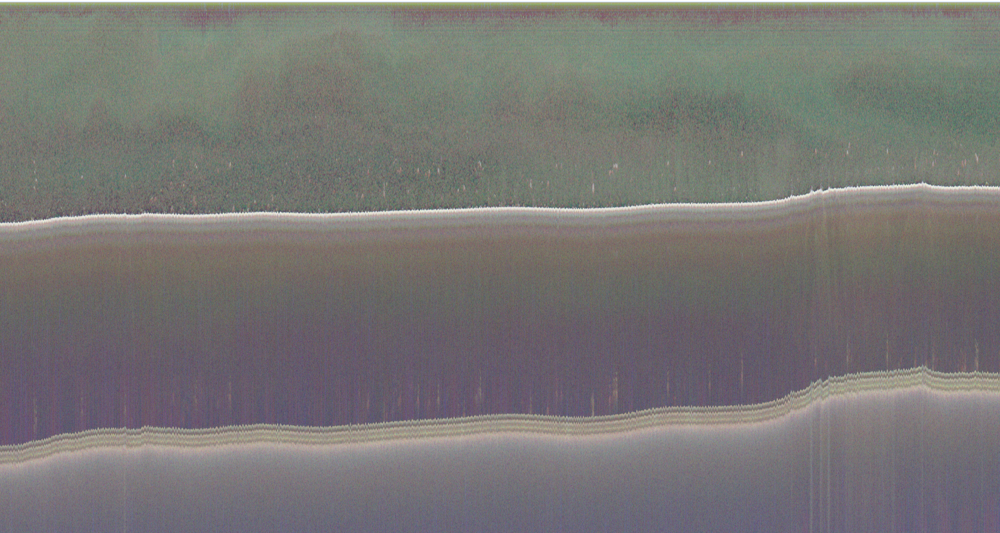

In [10]:
from IPython.display import Image
Image(IMAGE_PATH)

/tmp/ipykernel_1333944/646491251.py:1: DeprecationWarning: `echopype.visualization` is deprecated and will be removed in an upcoming release. 
Use Echoshader for visualization functions instead. 
Repository: https://github.com/OSOceanAcoustics/echoshader 
Echogram plotting: https://echoshader.readthedocs.io/en/latest/version_0.1.0/echogram_examples.html
  from echopype.visualize.cm import cmap_d


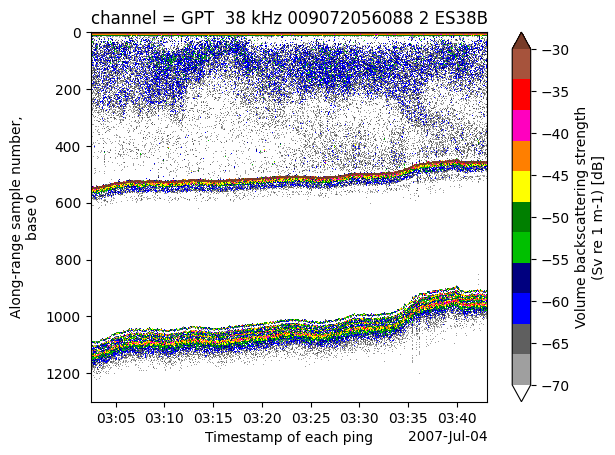

In [11]:
from echopype.visualize.cm import cmap_d

# Plot the 38 kHz backscatter channel
dataset["Sv"].isel(channel=1).plot.pcolormesh(y="range_sample", yincrease=False, vmin=-70, vmax=-30, cmap=cmap_d["ek500"])

In [1]:
!nvidia-smi

Thu May 23 13:39:21 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4070 ...    Off |   00000000:01:00.0 Off |                  N/A |
| N/A   42C    P8              4W /   80W |       8MiB /   8188MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!kill 1333944

In [12]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
sam = sam_model_registry["vit_h"](checkpoint='/home/ubuntu/SAM/sam_vit_h_4b8939.pth').to(device='cuda')
mask_generator = SamAutomaticMaskGenerator(sam)

In [14]:
import cv2
import torch

image_bgr = cv2.imread(IMAGE_PATH)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
masks = mask_generator.generate(image_rgb)

In [ ]:
#https://colab.research.google.com/drive/1iCoZkZUJUkdYKW98wkTPhS-PAQvpRaF5#scrollTo=u34UjLT8o7iC
masks = mask_generator.generate(image_rgb)

In [16]:
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

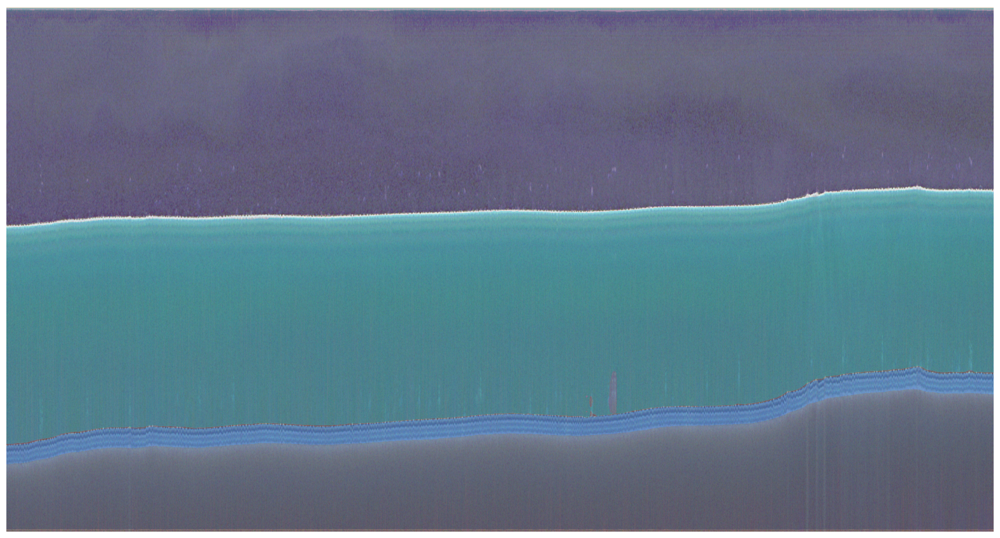

In [17]:
plt.figure(figsize=(20,20))
plt.imshow(image_bgr)
show_anns(masks)
plt.axis('off')
plt.show()